In [1]:
import lib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.axes import Axes

from IPython.display import HTML

In [2]:
f = lambda x: 2 * x
f1 = lambda x: x * 0 + 2
# f = lambda x: 0.5 * x**2
# f1 = lambda x: x

N = 100
x = np.linspace(-1, 1, num=N)
u0 = np.where(np.abs(x) > 0.5, 1.0, 0.0)
t_end = 5

naive_app = lib.FVM(f, f1, lib.naive_flux, N, t_end, u0, tag="Naive")
lw_app = lib.FVM(f, f1, lib.lax_wendroff_flux, N, t_end, u0, tag="Lax Wendroff")
lf_app = lib.FVM(f, f1, lib.lax_friedrichs_flux, N, t_end, u0, tag="Lax Friedrichs")

apps = [naive_app, lf_app, lw_app]

In [3]:
ress = [lib.calc(app) for app in apps]

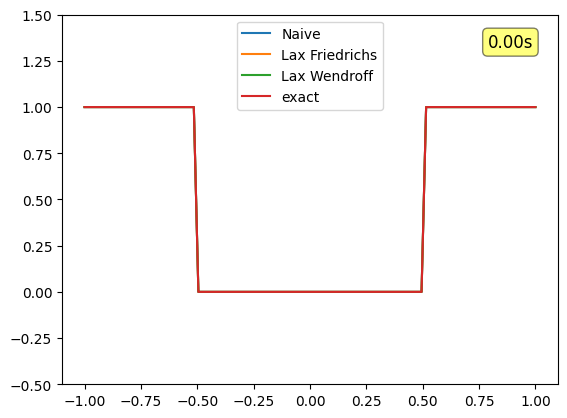

In [4]:
plt.ioff()


t_end = apps[0].t_end if len(apps) else 1.0

fig, ax = plt.subplots(nrows=1, squeeze=False)
ax1: Axes = ax[0][0]
# ax2: Axes = ax[0][1]

lines = []
for res, app in zip(ress, apps):
    us, ts, dts = res
    lines += ax1.plot(x, us[0], label=app.tag)

[exact] = ax1.plot(x, lib.lin_adv(x, 0), label="exact")

text = ax1.text(
    0.95,
    0.95,  # x, y in axes coordinates
    "test",
    transform=ax1.transAxes,  # use axes coordinates (0..1)
    fontsize=12,
    verticalalignment="top",  # top of text at y=0.95
    horizontalalignment="right",  # right-align text at x=0.95
    bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.5),
)
ax1.set_ylim(-0.5, 1.5)
# ax2.set_xlim(ts[0], ts[-1])
ax1.legend()

FPS = 30

times = np.linspace(0, t_end, num=int(t_end * FPS))

uss = [res[0] for res in ress]
tss = [res[1] for res in ress]

ixs = [np.minimum(len(ts) - 1, np.searchsorted(ts, times)) for ts in tss]


def update(frame, lines, exact, text, FPS):

    for i, line in enumerate(lines):
        line.set_ydata(uss[i][ixs[i][frame]])

    exact.set_ydata(lib.lin_adv(x, times[frame]))

    text = text.set_text(f"{times[frame]:#.3}s")

    # if frame % FPS // 2 == 0:
    #     ax1.relim()
    #     ax1.autoscale_view(scalex=False)

    return (*lines, exact, text)


ani = animation.FuncAnimation(
    fig=fig,
    func=update,
    frames=int(t_end * FPS),
    interval=1000 / FPS,
    fargs=(lines, exact, text, FPS),
)


# HTML(anim.to_html5_video())
HTML(ani.to_jshtml(fps=FPS))

In [5]:
f = lambda x: 0.5 * x**2
f1 = lambda x: x

N = 100
x = np.linspace(-1, 1, num=N)
u0 = np.where(np.abs(x) > 0.5, 1.0, 0.0)
t_end = 5

naive_app = lib.FVM(f, f1, lib.naive_flux, N, t_end, u0, tag="Naive")
lw_app = lib.FVM(f, f1, lib.lax_wendroff_flux, N, t_end, u0, tag="Lax Wendroff")
lf_app = lib.FVM(f, f1, lib.lax_friedrichs_flux, N, t_end, u0, tag="Lax Friedrichs")

apps = [naive_app, lf_app, lw_app]

In [6]:
ress = [lib.calc(app) for app in apps]

/tmp/ipykernel_37771/179194728.py:1: RuntimeWarning: overflow encountered in square
  f = lambda x: 0.5 * x**2
/home/paulemeister/Code/Python/PDE/homework/pe3/lib/__init__.py:55: RuntimeWarning: invalid value encountered in subtract
  new_u = u + dt / dx * (lF - rF)


In [7]:
plt.ioff()


t_end = apps[0].t_end if len(apps) else 1.0

fig, ax = plt.subplots(nrows=1, squeeze=False)
ax1: Axes = ax[0][0]
# ax2: Axes = ax[0][1]

lines = []
for res, app in zip(ress, apps):
    us, ts, dts = res
    lines += ax1.plot(x, us[0], label=app.tag)

[exact] = ax1.plot(x, lib.lin_adv(x, 0), label="exact")

text = ax1.text(
    0.95,
    0.95,  # x, y in axes coordinates
    "test",
    transform=ax1.transAxes,  # use axes coordinates (0..1)
    fontsize=12,
    verticalalignment="top",  # top of text at y=0.95
    horizontalalignment="right",  # right-align text at x=0.95
    bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.5),
)
ax1.set_ylim(-0.5, 1.5)
# ax2.set_xlim(ts[0], ts[-1])
ax1.legend()

FPS = 30

times = np.linspace(0, t_end, num=int(t_end * FPS))

uss = [res[0] for res in ress]
tss = [res[1] for res in ress]

ixs = [np.minimum(len(ts) - 1, np.searchsorted(ts, times)) for ts in tss]


def update(frame, lines, exact, text, FPS):

    for i, line in enumerate(lines):
        line.set_ydata(uss[i][ixs[i][frame]])

    exact.set_ydata(lib.burgers(x, times[frame]))

    text = text.set_text(f"{times[frame]:#.3}s")

    # if frame % FPS // 2 == 0:
    #     ax1.relim()
    #     ax1.autoscale_view(scalex=False)

    return (*lines, exact, text)


ani = animation.FuncAnimation(
    fig=fig,
    func=update,
    frames=int(t_end * FPS),
    interval=1000 / FPS,
    fargs=(lines, exact, text, FPS),
)


# HTML(anim.to_html5_video())
HTML(ani.to_jshtml(fps=FPS))